In [ ]:
# pip install ISLP

In [ ]:
#basic imports
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

#preprossing imports
# from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder,RobustScaler,FunctionTransformer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

#model development imports
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA, QuadraticDiscriminantAnalysis as QDA
from sklearn import tree
from sklearn.naive_bayes import MultinomialNB as MNB
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, silhouette_score
from sklearn.cluster import KMeans , AgglomerativeClustering

from scipy.cluster.hierarchy import dendrogram, linkage

# from ISLP import confusion_table as ct
# from ISLP.models import (ModelSpec as MS, summarize)
# import statsmodels.api as sm

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
data = pd.read_excel('/content/drive/MyDrive/Colab Notebooks/projects/Dry_Bean_Dataset.xlsx')

In [ ]:
data.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715.0,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172.0,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690.0,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724.0,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417.0,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER


In [ ]:
data.shape

(13611, 17)

In [ ]:
#checking for null values
null_values = data.isnull().sum()
null_values

Area               0
Perimeter          0
MajorAxisLength    0
MinorAxisLength    2
AspectRation       3
Eccentricity       0
ConvexArea         2
EquivDiameter      1
Extent             3
Solidity           3
roundness          0
Compactness        0
ShapeFactor1       1
ShapeFactor2       1
ShapeFactor3       1
ShapeFactor4       0
Class              0
dtype: int64

In [ ]:
# since null values are less better to drop them
data = data.dropna()
data.shape

(13595, 17)

In [ ]:
#remove duplicates
duplicates_num = data.duplicated().sum()
print(duplicates_num)
data = data.drop_duplicates()
print(data.shape)

68
(13527, 17)


In [ ]:
# data.info()
data.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13527.000000,13527.00000,13527.000000,13527.000000,13527.000000,13527.000000,13527.000000,13527.000000,13527.000000,13527.000000,13527.000000,13527.000000,13527.000000,13527.000000,13527.000000,13527.000000
mean,53069.236786,855.21922,327.384082,202.381573,1.581533,0.751262,53789.227397,253.089916,0.749795,0.987667,0.873583,0.800216,0.006561,0.002309,0.644111,0.995074
std,29405.053698,214.74846,861.335458,45.075453,0.245021,0.121291,29856.955487,59.320378,0.048956,0.060476,0.059367,0.061368,0.001130,0.068772,0.098475,0.004347
min,9.000000,524.73600,183.601165,122.512653,1.024868,0.218951,9.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36321.500000,703.39000,253.280692,175.858669,1.432021,0.715833,36707.500000,215.048762,0.718709,0.985673,0.833319,0.763163,0.005888,0.001158,0.582418,0.993714
50%,44606.000000,794.21300,296.512041,192.500481,1.550165,0.764108,45136.000000,238.315176,0.759812,0.988286,0.883384,0.801448,0.006643,0.001699,0.642320,0.996389
75%,61433.500000,977.30400,376.454675,217.274070,1.704040,0.809714,62401.000000,279.677603,0.786851,0.990018,0.916966,0.834310,0.007271,0.002171,0.696072,0.997886
max,254616.000000,1985.37000,100000.000000,460.198497,2.430306,10.000000,263261.000000,569.374358,0.866195,8.000000,0.990685,0.987303,0.010451,8.000000,0.974767,0.999733


In [ ]:
#Preprossing steps

In [ ]:
#replacing class data with values
set(data['Class'])
encoder = LabelEncoder()
data['Class'] = encoder.fit_transform(data['Class'])
data.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715.0,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,5
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172.0,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,5
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690.0,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,5
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724.0,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,5
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417.0,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,5


In [ ]:
# shows labels with values
mapping = dict(zip(range(len(encoder.classes_)), encoder.classes_))
mapping

{0: 'BARBUNYA',
 1: 'BOMBAY',
 2: 'CALI',
 3: 'DERMASON',
 4: 'HOROZ',
 5: 'SEKER',
 6: 'SIRA'}

In [ ]:
# tried mim max scaler as well but not able to scale well since variance is very high
scaler = RobustScaler()
features = data.columns.drop(['Class' , 'Solidity' , 'ShapeFactor2' , 'ShapeFactor4' , 'ShapeFactor3'])
data[features] = scaler.fit_transform(data[features])

# to make data +ve since NB requires +ve values
for col in data:
    if data[col].min() < 0:
        data[col] += abs(data[col].min())

data.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,1.130376,0.312343,0.199530,1.240507,0.633500,3.524250,1.117248,0.447128,3.061340,0.988856,5.599854,3.834079,3.292491,0.003147,0.834222,0.998724,5
1,1.143875,0.413568,0.137396,1.454091,0.266485,2.054021,1.135034,0.464638,3.355511,0.984986,4.751123,4.403372,3.037358,0.003564,0.909851,0.998430,5
2,1.169600,0.362793,0.237266,1.289822,0.679531,3.661819,1.155195,0.497721,3.269590,0.989559,5.478179,3.769656,3.229154,0.003048,0.825871,0.999066,5
3,1.194608,0.442285,0.218852,1.448830,0.473388,2.978920,1.195439,0.529536,3.336627,0.976696,4.953196,4.044506,3.064885,0.003215,0.861794,0.994199,5
4,1.199865,0.348277,0.148138,1.636266,0.132088,1.222059,1.183490,0.536181,3.195992,0.990893,5.920846,4.637462,2.833706,0.003665,0.941900,0.999166,5


In [ ]:
data.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
count,13527.000000,13527.000000,13527.000000,13527.000000,13527.000000,13527.000000,13527.000000,13527.000000,13527.000000,13527.000000,13527.000000,13527.000000,13527.000000,13527.000000,13527.000000,13527.000000,13527.000000
mean,2.112943,1.206522,1.167316,1.928484,2.046424,5.670039,2.093145,1.421133,2.854023,0.987667,4.590317,2.243812,2.735345,0.002309,0.644111,0.995074,3.528572
std,1.170956,0.784000,6.992836,1.088374,0.900750,1.291967,1.162043,0.917862,0.718438,0.060476,0.709736,0.862563,0.817260,0.068772,0.098475,0.004347,1.833380
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.919246,0.000000,0.000000,0.000000,0.000564,0.410339,0.947687,0.000000
25%,1.446022,0.652227,0.565700,1.288072,1.496785,5.292665,1.428318,0.832523,2.397825,0.985673,4.108960,1.723015,2.248807,0.001158,0.582418,0.993714,2.000000
50%,1.775924,0.983801,0.916678,1.689899,1.931109,5.806877,1.756359,1.192524,3.001017,0.988286,4.707494,2.261136,2.794391,0.001699,0.642320,0.996389,3.000000
75%,2.446022,1.652227,1.565700,2.288072,2.496785,6.292665,2.428318,1.832523,3.397825,0.990018,5.108960,2.723015,3.248807,0.002171,0.696072,0.997886,5.000000
max,10.138858,5.332455,810.369172,8.153630,5.166701,104.185343,10.245860,6.314992,4.562194,8.000000,5.990285,4.873418,5.548223,8.000000,0.974767,0.999733,6.000000


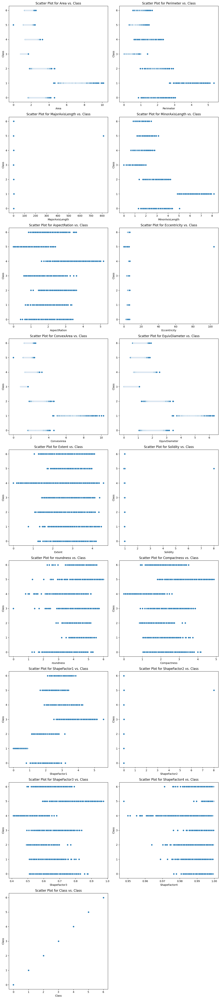

In [ ]:
def plot(X):
    features = X.columns
    num_features = len(features)
    rows = (num_features + 1) // 2
    cols = 2
    fig, axes = plt.subplots(rows, cols, figsize=(12, 6*rows))
    axes = axes.flatten()

    for i, feature in enumerate(features):
        sns.scatterplot(x=feature, y='Class', data=X, ax=axes[i])
        axes[i].set_title(f'Scatter Plot for {feature} vs. Class')
        axes[i].set_xlabel(feature)
        axes[i].set_ylabel('Class')

    if num_features % 2 != 0:
        fig.delaxes(axes[-1])

    plt.tight_layout()
    plt.show()

plot(data)

In [ ]:
data.columns

Index(['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
       'AspectRation', 'Eccentricity', 'ConvexArea', 'EquivDiameter', 'Extent',
       'Solidity', 'roundness', 'Compactness', 'ShapeFactor1', 'ShapeFactor2',
       'ShapeFactor3', 'ShapeFactor4', 'Class'],
      dtype='object')

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,1.130376,0.312343,0.199530,1.240507,0.633500,3.524250,1.117248,0.447128,3.061340,0.988856,5.599854,3.834079,3.292491,0.003147,0.834222,0.998724,5
1,1.143875,0.413568,0.137396,1.454091,0.266485,2.054021,1.135034,0.464638,3.355511,0.984986,4.751123,4.403372,3.037358,0.003564,0.909851,0.998430,5
2,1.169600,0.362793,0.237266,1.289822,0.679531,3.661819,1.155195,0.497721,3.269590,0.989559,5.478179,3.769656,3.229154,0.003048,0.825871,0.999066,5
3,1.194608,0.442285,0.218852,1.448830,0.473388,2.978920,1.195439,0.529536,3.336627,0.976696,4.953196,4.044506,3.064885,0.003215,0.861794,0.994199,5
4,1.199865,0.348277,0.148138,1.636266,0.132088,1.222059,1.183490,0.536181,3.195992,0.990893,5.920846,4.637462,2.833706,0.003665,0.941900,0.999166,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13606,1.676011,0.857787,0.853431,1.531605,1.940532,5.816401,1.654076,1.087317,2.337150,0.990331,5.104627,2.266993,2.950463,0.001749,0.642988,0.998385,3
13607,1.676171,0.849767,0.795421,1.646742,1.660077,5.504305,1.653531,1.087487,3.589944,0.990752,5.169331,2.553543,2.827275,0.001886,0.676099,0.998219,3
13608,1.677684,0.856418,0.795125,1.658207,1.645895,5.486863,1.656450,1.089104,2.562532,0.989899,5.126397,2.560255,2.822289,0.001888,0.676884,0.996767,3
13609,1.678003,0.872694,0.810086,1.636181,1.707452,5.561319,1.660264,1.089444,2.202357,0.987813,5.000658,2.486151,2.852985,0.001852,0.668237,0.995222,3


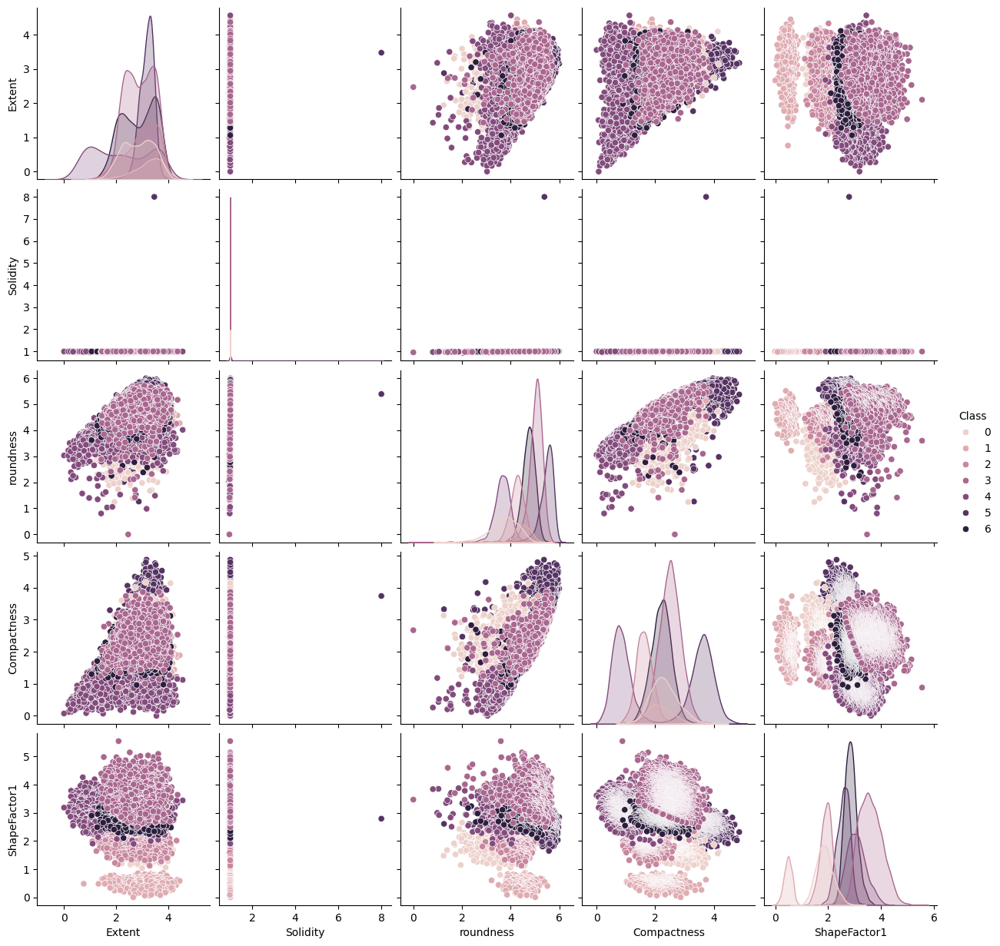

In [ ]:
selected_features = ['Extent',
       'Solidity', 'roundness', 'Compactness', 'ShapeFactor1','Class']
sub_Data = data[selected_features]
type(sub_Data)
sns.pairplot(sub_Data, hue='Class', kind='scatter') # very cost heavy process
data



In [ ]:

df_long = data.melt(id_vars=['Class'], var_name='Feature')
df_long
# Plot categorical scatter plot of each feature against 'Class'
sns.catplot(data=df_long, x='Class', y='value', hue='Feature', kind='swarm') # cost heavy operation


pred = data[data.columns.drop(['Class'])]
label = data['Class']
type(pred) # may be i should do after some steps

In [ ]:
#outliers
orf = ['ShapeFactor2','MajorAxisLength', 'Eccentricity','Solidity'] # outliers_removal_features , i plotted scatter to see weather outliers are present or not
z_scores = (data[orf] - data[orf].mean()) / data[orf].std()
limiter = 5
data = data[(z_scores.abs() < limiter).all(axis=1)]
data.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
count,13523.000000,13523.000000,13523.000000,13523.000000,13523.000000,13523.000000,13523.000000,13523.000000,13523.000000,13523.000000,13523.000000,13523.000000,13523.000000,13523.000000,13523.000000,13523.000000,13523.000000
mean,2.113147,1.206693,1.107638,1.928536,2.046840,5.663272,2.093348,1.421314,2.853933,0.987148,4.590130,2.243343,2.735350,0.001717,0.644055,0.995073,3.528137
std,1.171069,0.784051,0.696553,1.088530,0.900556,0.975015,1.162155,0.917936,0.718517,0.004652,0.709717,0.862253,0.817380,0.000594,0.098435,0.004347,1.833477
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.919246,0.000000,0.000000,0.000000,0.000564,0.410339,0.947687,0.000000
25%,1.446101,0.652437,0.565821,1.287966,1.497566,5.293299,1.428455,0.832615,2.397783,0.985671,4.108627,1.722868,2.248598,0.001158,0.582402,0.993712,2.000000
50%,1.776004,0.984192,0.916716,1.689899,1.931269,5.807001,1.756709,1.192606,3.000903,0.988286,4.707386,2.260977,2.794811,0.001699,0.642302,0.996389,3.000000
75%,2.446281,1.652334,1.565700,2.288890,2.496963,6.292665,2.428377,1.832752,3.397825,0.990018,5.108537,2.722651,3.248866,0.002170,0.696029,0.997883,5.000000
max,10.138858,5.332455,4.507924,8.153630,5.166701,7.376040,10.245860,6.314992,4.562194,0.994677,5.990285,4.873418,5.548223,0.003665,0.974767,0.999733,6.000000


In [ ]:
data.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,1.130376,0.312343,0.199530,1.240507,0.633500,3.524250,1.117248,0.447128,3.061340,0.988856,5.599854,3.834079,3.292491,0.003147,0.834222,0.998724,5
1,1.143875,0.413568,0.137396,1.454091,0.266485,2.054021,1.135034,0.464638,3.355511,0.984986,4.751123,4.403372,3.037358,0.003564,0.909851,0.998430,5
2,1.169600,0.362793,0.237266,1.289822,0.679531,3.661819,1.155195,0.497721,3.269590,0.989559,5.478179,3.769656,3.229154,0.003048,0.825871,0.999066,5
3,1.194608,0.442285,0.218852,1.448830,0.473388,2.978920,1.195439,0.529536,3.336627,0.976696,4.953196,4.044506,3.064885,0.003215,0.861794,0.994199,5
4,1.199865,0.348277,0.148138,1.636266,0.132088,1.222059,1.183490,0.536181,3.195992,0.990893,5.920846,4.637462,2.833706,0.003665,0.941900,0.999166,5


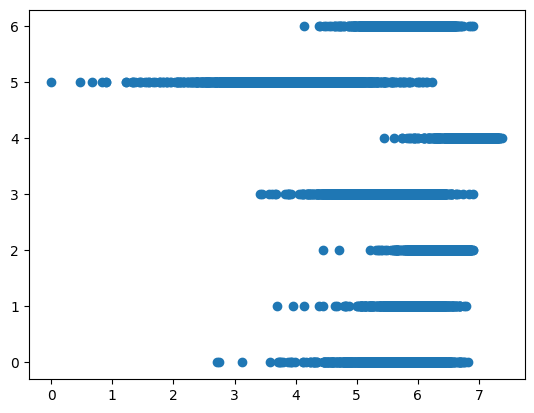

In [ ]:
plt.scatter(data['Eccentricity'] ,data['Class'] )

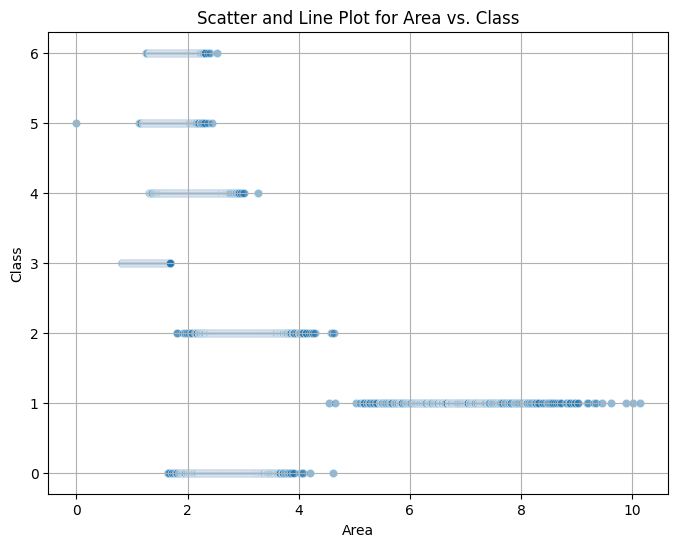

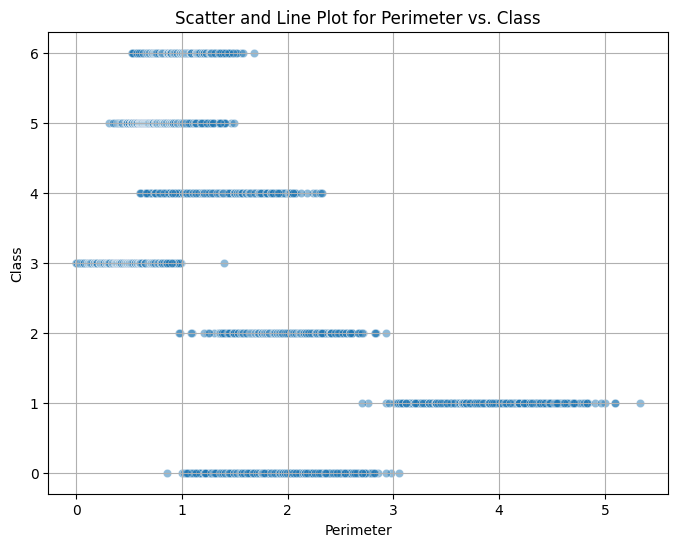

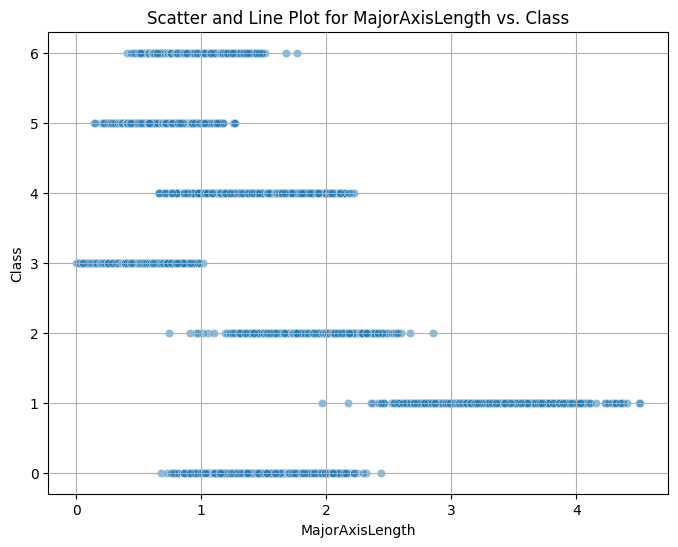

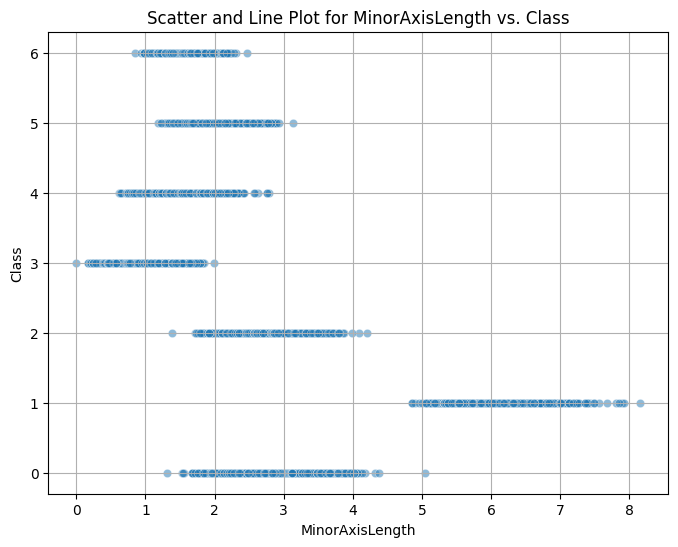

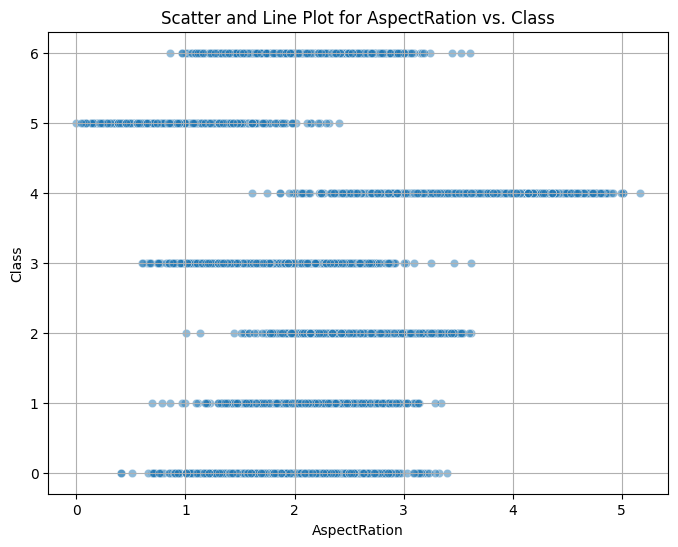

...

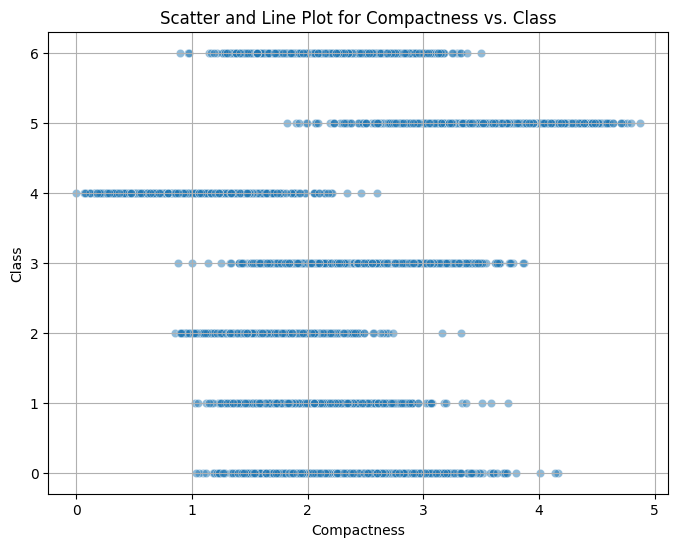

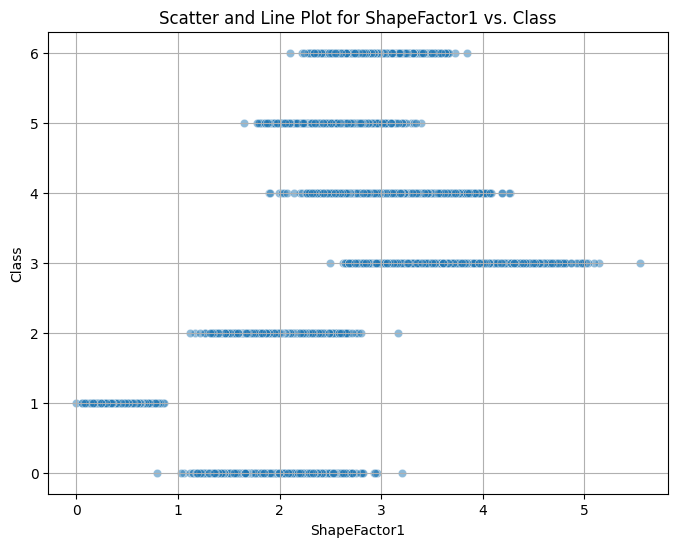

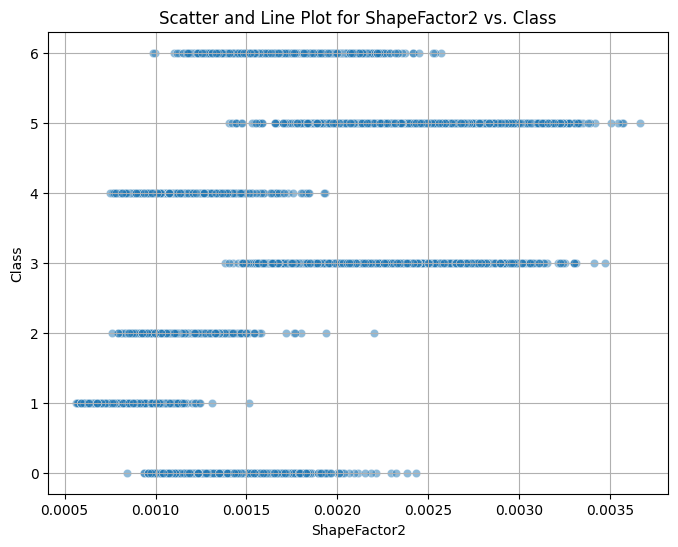

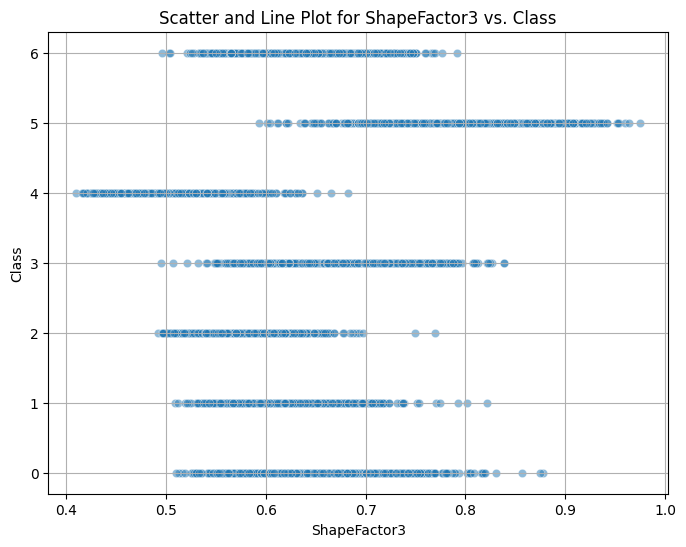

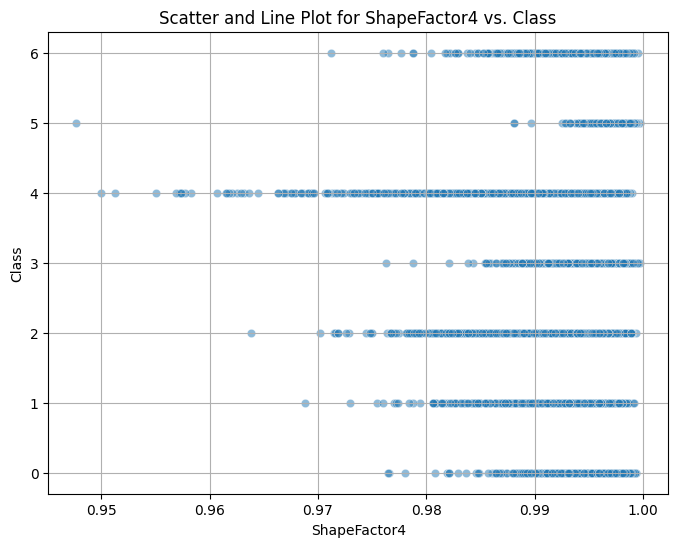

In [ ]:
# important block generates all plots vs graph

features = data.columns[:-1]

for feature in features:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=feature, y='Class', data=data, alpha=0.5)
    # sns.lineplot(x=feature, y='Class', data=data.groupby(feature)['Class'].mean(), color='red')
    plt.title(f'Scatter and Line Plot for {feature} vs. Class')
    plt.xlabel(feature)
    plt.ylabel('Class')
    plt.grid(True)



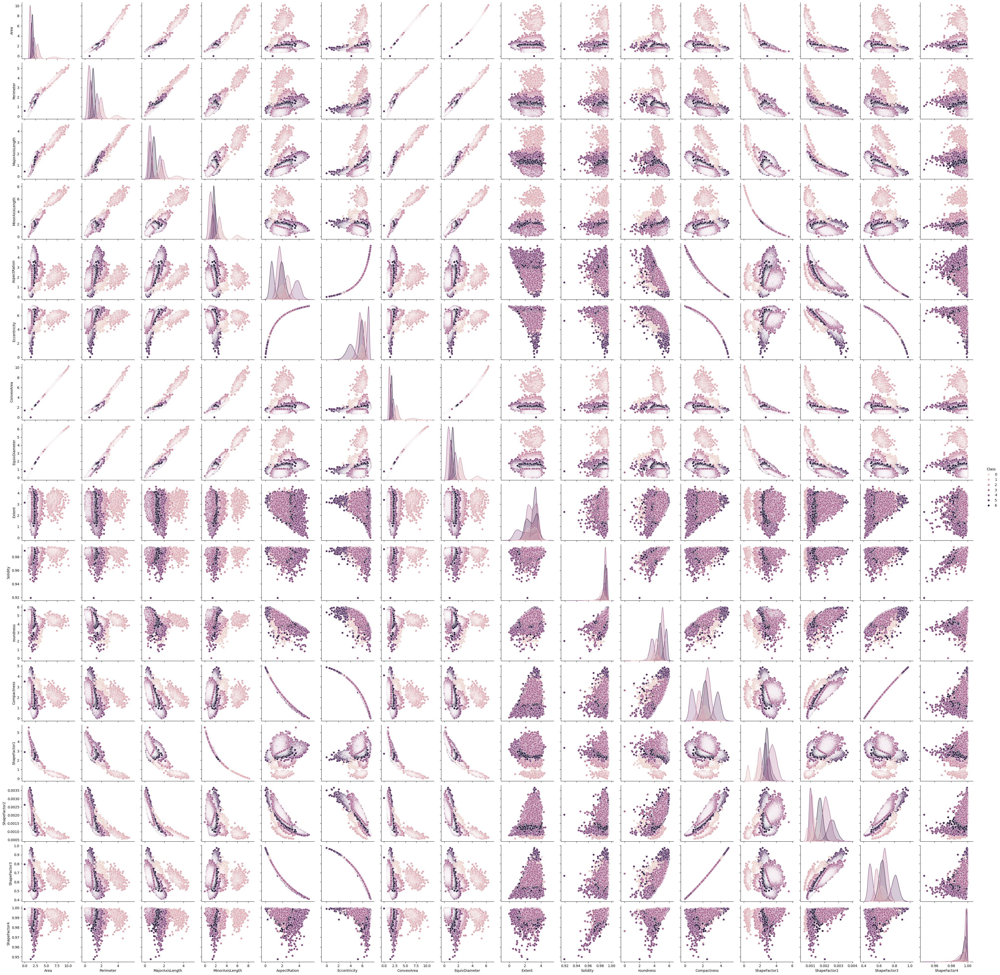

In [ ]:
sns.pairplot(data, hue='Class', diag_kind='kde') # very cost heavy process

In [ ]:
data.head(1)

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,1.130376,0.312343,0.19953,1.240507,0.6335,3.52425,1.117248,0.447128,3.06134,0.988856,5.599854,3.834079,3.292491,0.003147,0.834222,0.998724,5


In [ ]:
# bad way to edit data
# names=['AR/ECC', 'AR/PE/MA/ED/CA', 'CO/SF3']
# features = ['AspectRation', 'Eccentricity', 'Area', 'Perimeter', 'MajorAxisLength', 'EquivDiameter', 'ConvexArea', 'Compactness', 'ShapeFactor3']


# combined_feature = data[['AspectRation' ,'Eccentricity' ]].mean(axis = 1)
# data['Ar/Ecc'] = combined_feature

# combined_feature2 = data[[ 'Area', 'Perimeter', 'MajorAxisLength', 'EquivDiameter', 'ConvexArea' ]].mean(axis = 1)
# data['AR/PE/MA/ED/CA'] = combined_feature2

# combined_feature3 = data[['Compactness', 'ShapeFactor3' ]].mean(axis = 1)
# data['CO/SF3'] = combined_feature3

# data.drop(['AspectRation', 'Eccentricity', 'Area', 'Perimeter', 'MajorAxisLength', 'EquivDiameter', 'ConvexArea', 'Compactness', 'ShapeFactor3'] , axis=1,inplace=True)
# data.head()


# bad way to modify

# # Define the combine_features function
# def combine_features(X):
#     combined_features = []
#     combined_features.append(X[['AspectRation', 'Eccentricity']].mean(axis=1))
#     combined_features.append(X[['Area', 'Perimeter', 'MajorAxisLength', 'EquivDiameter', 'ConvexArea']].mean(axis=1))
#     combined_features.append(X[['Compactness', 'ShapeFactor3']].mean(axis=1))
#     return pd.concat(combined_features, axis=1)

# names=['AR/ECC', 'AR/PE/MA/ED/CA', 'CO/SF3']

# # Define the combined_feature_transformer
# combined_feature_transformer = ColumnTransformer(
#     transformers=[
#         ('combine', FunctionTransformer(validate=False), ['AspectRation', 'Eccentricity', 'Area', 'Perimeter', 'MajorAxisLength', 'EquivDiameter', 'ConvexArea', 'Compactness', 'ShapeFactor3'])
#     ],
#     remainder='passthrough'
# )

# # Define the pipeline
# pipeline = Pipeline([
#     ('combine_features', combined_feature_transformer)
# ])

# # Fit and transform the pipeline
# combined_features = pipeline.fit_transform(df)


# df_combined = pd.DataFrame(combined_features, index=df.index, names=['AR/ECC', 'AR/PE/MA/ED/CA', 'CO/SF3'])
# print(df_combined)


In [ ]:
# data2 = data.copy()
features = ['AspectRation', 'Eccentricity', 'Area', 'Perimeter', 'MajorAxisLength', 'EquivDiameter', 'ConvexArea', 'Compactness', 'ShapeFactor3']
names = ['AR/ECC', 'AR/PE/MA/ED/CA', 'CO/SF3']


combined_features_df = pd.DataFrame()


for name, feature_group in zip(names, [features[:2], features[2:7], features[7:]]):
    combined_feature = data[feature_group].mean(axis=1)
    combined_features_df[name] = combined_feature

combined_features_df

data = pd.concat([data , pd.DataFrame(combined_features_df)] , axis = 1 )
data.drop(['AspectRation', 'Eccentricity', 'Area', 'Perimeter', 'MajorAxisLength', 'EquivDiameter', 'ConvexArea', 'Compactness', 'ShapeFactor3'] , axis=1,inplace=True)
data.head()

,MinorAxisLength,Extent,Solidity,roundness,ShapeFactor1,ShapeFactor2,ShapeFactor4,Class,AR/ECC,AR/PE/MA/ED/CA,CO/SF3
0,1.240507,3.061340,0.988856,5.599854,3.292491,0.003147,0.998724,5,2.078875,0.641325,2.334151
1,1.454091,3.355511,0.984986,4.751123,3.037358,0.003564,0.998430,5,1.160253,0.658902,2.656611
2,1.289822,3.269590,0.989559,5.478179,3.229154,0.003048,0.999066,5,2.170675,0.684515,2.297763
3,1.448830,3.336627,0.976696,4.953196,3.064885,0.003215,0.994199,5,1.726154,0.716144,2.453150
4,1.636266,3.195992,0.990893,5.920846,2.833706,0.003665,0.999166,5,0.677073,0.683190,2.789681


In [ ]:
#to shift Y(class) to right
col = data.pop('Class')
data['Class'] = col
# data.head(1)
data.describe()

,MinorAxisLength,Extent,Solidity,roundness,ShapeFactor1,ShapeFactor2,ShapeFactor4,AR/ECC,AR/PE/MA/ED/CA,CO/SF3,Class
count,13523.000000,13523.000000,13523.000000,13523.000000,13523.000000,13523.000000,13523.000000,13523.000000,13523.000000,13523.000000,13523.000000
mean,1.928536,2.853933,0.987148,4.590130,2.735350,0.001717,0.995073,3.855056,1.588428,1.443699,3.528137
std,1.088530,0.718517,0.004652,0.709717,0.817380,0.000594,0.004347,0.919889,0.936018,0.480286,1.833477
min,0.000000,0.000000,0.919246,0.000000,0.000000,0.000564,0.947687,0.000000,0.323638,0.205169,0.000000
25%,1.287966,2.397783,0.985671,4.108627,2.248598,0.001158,0.993712,3.395433,0.985795,1.152635,2.000000
50%,1.689899,3.000903,0.988286,4.707386,2.794811,0.001699,0.996389,3.869135,1.322212,1.451639,3.000000
75%,2.288890,3.397825,0.990018,5.108537,3.248866,0.002170,0.997883,4.394814,1.986500,1.709340,5.000000
max,8.153630,4.562194,0.994677,5.990285,5.548223,0.003665,0.999733,6.271370,7.308018,2.924093,6.000000


In [ ]:
# data.to_excel('Dry_Bean_updated.xlsx') # to import into other notebook so that i can start work directly

##<------------------------------ Preprocessing Part Done ----------------------------->




## Using scikit-learn (sklearn):

Supervised methods:
- Logistic Regression
- KNN (K-Nearest Neighbors)
- LDA (Linear Discriminant Analysis)
- QDA (Quadratic Discriminant Analysis)
- Decision Trees
- Naive Bayes

Unsupervised methods:
- K-Means Clustering
- Hierarchical Clustering

## Using TensorFlow (tf):

Supervised methods:

- SVM (Support Vector Machines)
- Neural Network

In [ ]:
#calculating no of features
for i in range(7):
  print(i ,'count :' ,(data['Class'] == i).sum() )

0 count : 1322
1 count : 522
2 count : 1630
3 count : 3546
4 count : 1860
5 count : 2007
6 count : 2636


In [ ]:
X = data[data.columns.drop('Class')]
y = data['Class']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

Logistic Regression

In [ ]:
# model_islp = sm.GLM(y , X , family=sm.families.Binomial());
# result = model_islp.fit(); # train the model
# summarize(result)

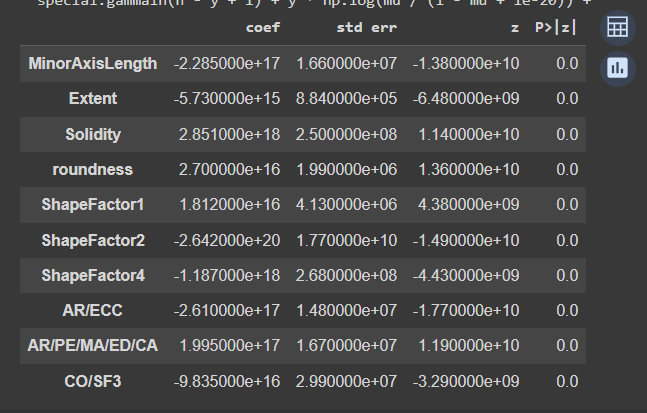

In [ ]:
#100 iteration gives same accuracy as 1lakh iterations
logistic_reg = LogisticRegression(max_iter=100, multi_class='multinomial', solver='lbfgs')


logistic_reg.fit(X_train, y_train)
y_pred = logistic_reg.predict(X_test)

# Evaluate the model
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:")
print(classification_report(y_test, y_pred))

conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
# print(conf_matrix)
# ct(y_pred,y_test) # islp package shows good confusion table

Accuracy: 0.9046210720887246
Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.85      0.88       262
           1       0.99      1.00      1.00       113
           2       0.90      0.91      0.90       325
           3       0.91      0.88      0.90       683
           4       0.94      0.93      0.94       361
           5       0.93      0.94      0.94       408
           6       0.84      0.88      0.86       553

    accuracy                           0.90      2705
   macro avg       0.92      0.92      0.92      2705
weighted avg       0.91      0.90      0.90      2705

Confusion Matrix:


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


KNN

In [ ]:
no_of_neigh = 15 # no of neighbours
knn = KNeighborsClassifier(n_neighbors=no_of_neigh)
knn.fit(X_train , y_train)
y_pred_knn = knn.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred_knn))
print("Classification Report:")
print(classification_report(y_test, y_pred_knn))

confusion_matrix(y_test, y_pred_knn )

Accuracy: 0.9134935304990758
Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.83      0.88       262
           1       0.99      1.00      1.00       113
           2       0.89      0.92      0.90       325
           3       0.92      0.90      0.91       683
           4       0.96      0.94      0.95       361
           5       0.94      0.95      0.95       408
           6       0.85      0.90      0.88       553

    accuracy                           0.91      2705
   macro avg       0.93      0.92      0.92      2705
weighted avg       0.91      0.91      0.91      2705



array([[218,   1,  27,   0,   3,   2,  11],
       [  0, 113,   0,   0,   0,   0,   0],
       [ 14,   0, 300,   0,   5,   1,   5],
       [  0,   0,   0, 615,   0,  15,  53],
       [  0,   0,  10,   4, 339,   0,   8],
       [  2,   0,   0,  10,   0, 388,   8],
       [  0,   0,   1,  40,   7,   7, 498]])

Linear Discriminant Analysis

In [ ]:
clf = LDA()
clf.fit(X_train, y_train)
y_pred_lda = clf.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred_lda))
print("Classification Report:")
print(classification_report(y_test, y_pred_lda))

confusion_matrix(y_test , y_pred_lda)

Accuracy: 0.8961182994454714
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.83      0.88       262
           1       0.99      1.00      1.00       113
           2       0.92      0.94      0.93       325
           3       0.94      0.83      0.88       683
           4       0.95      0.94      0.95       361
           5       0.95      0.90      0.93       408
           6       0.76      0.93      0.83       553

    accuracy                           0.90      2705
   macro avg       0.92      0.91      0.91      2705
weighted avg       0.91      0.90      0.90      2705



array([[218,   1,  19,   0,   3,   1,  20],
       [  0, 113,   0,   0,   0,   0,   0],
       [  4,   0, 304,   0,   6,   1,  10],
       [  3,   0,   0, 565,   0,  14, 101],
       [  0,   0,   8,   4, 339,   0,  10],
       [  6,   0,   0,   7,   0, 369,  26],
       [  1,   0,   1,  24,   8,   3, 516]])

In [ ]:
qlf = QDA()
qlf.fit(X_train, y_train)
y_pred_qda = qlf.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred_qda))
print("Classification Report:")
print(classification_report(y_test, y_pred_qda))

confusion_matrix(y_test , y_pred_qda)

Accuracy: 0.9083179297597043
Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.84      0.90       262
           1       0.99      1.00      1.00       113
           2       0.90      0.94      0.92       325
           3       0.94      0.84      0.89       683
           4       0.95      0.96      0.95       361
           5       0.94      0.94      0.94       408
           6       0.80      0.93      0.86       553

    accuracy                           0.91      2705
   macro avg       0.93      0.92      0.92      2705
weighted avg       0.91      0.91      0.91      2705



/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:926: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


array([[219,   1,  27,   0,   3,   4,   8],
       [  0, 113,   0,   0,   0,   0,   0],
       [  7,   0, 307,   0,   7,   1,   3],
       [  0,   0,   0, 575,   0,  12,  96],
       [  0,   0,   7,   4, 345,   0,   5],
       [  1,   0,   0,  10,   0, 383,  14],
       [  0,   0,   1,  22,   9,   6, 515]])

Decision Trees

In [ ]:
decision_tree = tree.DecisionTreeClassifier()
decision_tree.fit(X_train , y_train)
y_pred_decTree = decision_tree.predict(X_test)


print("Accuracy:", accuracy_score(y_test, y_pred_decTree))
print("Classification Report:")
print(classification_report(y_test, y_pred_decTree))

confusion_matrix(y_test , y_pred_decTree)

Accuracy: 0.8935304990757856
Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.86      0.88       262
           1       0.99      1.00      1.00       113
           2       0.88      0.87      0.88       325
           3       0.90      0.88      0.89       683
           4       0.92      0.92      0.92       361
           5       0.93      0.93      0.93       408
           6       0.82      0.87      0.85       553

    accuracy                           0.89      2705
   macro avg       0.91      0.91      0.91      2705
weighted avg       0.89      0.89      0.89      2705



array([[226,   1,  17,   0,   4,   4,  10],
       [  0, 113,   0,   0,   0,   0,   0],
       [ 20,   0, 283,   0,  14,   2,   6],
       [  0,   0,   0, 600,   1,  13,  69],
       [  1,   0,  15,   3, 332,   0,  10],
       [  0,   0,   4,  14,   0, 380,  10],
       [  3,   0,   2,  46,   9,  10, 483]])

Naive Bayes

In [ ]:
naive_model = MNB()
naive_model.fit(X_train,y_train)
y_pred_nb = naive_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred_nb))
print("Classification Report:")
print(classification_report(y_test, y_pred_nb))

confusion_matrix(y_test , y_pred_nb)

Accuracy: 0.7752310536044362
Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.26      0.42       262
           1       0.99      1.00      1.00       113
           2       0.69      0.84      0.76       325
           3       0.71      1.00      0.83       683
           4       0.97      0.80      0.87       361
           5       0.98      0.72      0.83       408
           6       0.67      0.69      0.68       553

    accuracy                           0.78      2705
   macro avg       0.86      0.76      0.77      2705
weighted avg       0.81      0.78      0.76      2705



array([[ 69,   1, 121,   0,   2,   2,  67],
       [  0, 113,   0,   0,   0,   0,   0],
       [  0,   0, 273,   0,   4,   1,  47],
       [  0,   0,   0, 682,   0,   1,   0],
       [  0,   0,   4,  22, 288,   0,  47],
       [  0,   0,   0,  89,   0, 292,  27],
       [  0,   0,   0, 168,   4,   1, 380]])

## Clustering

k-means

In [ ]:
kmeans = KMeans(n_clusters=7, random_state=33, n_init="auto").fit(X_train)
kmeans_labels = kmeans.predict(X_test)

In [ ]:
# set(kmeans.labels_)
for i in range(7):
  print(i ,'count :' ,(kmeans_labels == i).sum() )

0 count : 545
1 count : 529
2 count : 114
3 count : 410
4 count : 227
5 count : 702
6 count : 178


In [ ]:
for i in range(7):
  print(i ,'count :' ,(y_test == i).sum() )

0 count : 262
1 count : 113
2 count : 325
3 count : 683
4 count : 361
5 count : 408
6 count : 553


In [ ]:
#ranges between -1 and 1 i.e .35 score suggests that clusteres are indeed well seperted
silhouette = silhouette_score(X_test, kmeans_labels)
print("Silhouette Score:", silhouette)

Silhouette Score: 0.36605021710100927


GPT interperetation

A silhouette score of 0.35 suggests that the clusters in your data are reasonably well-separated. Here's how to interpret the silhouette score:

The silhouette score ranges from -1 to 1.
A score close to 1 indicates that the data points are well-clustered, with each point being closer to its own cluster than to other clusters.
A score close to 0 suggests overlapping clusters or clusters with similar densities.
A negative score indicates that the data points might have been assigned to the wrong clusters.
In your case, a silhouette score of 0.35 indicates that the clusters are somewhat well-separated, but there may still be some degree of overlap or suboptimal clustering. It's generally a decent score, but it's always essential to consider the context of your specific dataset and problem domain when interpreting clustering results. Additionally, visual inspection of the clusters can provide more insights into their quality and structure.

In [ ]:
data_int = X_test.copy() # created for data interperetation
data_int['kmeans_res'] = kmeans_labels
data_int['actual_res'] = y_test
# data_int[data_int['actual_res'] == 2].head(30)
# data_int[data_int['kmeans_res'] == 5].head(30)
data_int.head()

,MinorAxisLength,Extent,Solidity,roundness,ShapeFactor1,ShapeFactor2,ShapeFactor4,AR/ECC,AR/PE/MA/ED/CA,CO/SF3,kmeans_res,actual_res
10234,0.654467,2.937051,0.986718,5.307999,4.162818,0.002660,0.997047,3.263523,0.517866,1.778463,1,3
8099,1.415968,2.669820,0.982811,4.742346,3.117355,0.001615,0.991415,4.156135,1.235782,1.280920,5,6
11264,0.748517,3.019974,0.983865,4.589516,4.052393,0.001910,0.989452,4.145681,0.779997,1.280637,1,3
8535,1.572881,2.738976,0.988804,4.741739,2.926960,0.001652,0.994001,4.002494,1.297684,1.373340,5,6
377,1.801945,3.434183,0.989084,5.482184,2.665078,0.002920,0.999184,1.845038,0.917717,2.427444,3,5


clustering interperetation its almost near to the y_test considering no labels are provided

table map

| y_actual | Clustering_res |
|----------|----------------|
|    0     |       2        |
|    1     |       1        |
|    2     |       2        |
|    3     |       3        |
|    4     |       4        |
|    5     |       6        |
|    6     |       0        |
|  2.6.4.3 |       5        |


In [ ]:
#clustering interperetation its almost near to the y_test considering no labels are provided
'''
    y_actual    Clustering_res
    0           2
    1           1
    2           2
    3           3
    4           4
    5           6
    6           0
    2.6.4.3     5
'''

Herarcial Clustering

In [ ]:
n_clusters = 7
clustering = AgglomerativeClustering(n_clusters=n_clusters).fit(X_train)


cluster_labels = clustering.labels_
print("Cluster labels:", cluster_labels)


Cluster labels: [0 4 1 ... 1 4 3]


In [ ]:
test_labels = clustering.fit_predict(X_test)
data_int['Hi_res'] = test_labels

In [ ]:
#it seems for this data kmeans performs better, though both methods provides good cluster seperation
data_int[data_int['Hi_res'] == 4].head(10)

In [ ]:
for i in range(7):
  print(i ,'count :' ,(test_labels == i).sum() )

In [ ]:
silhouette_hc = silhouette_score(X_test, test_labels)
silhouette_hc

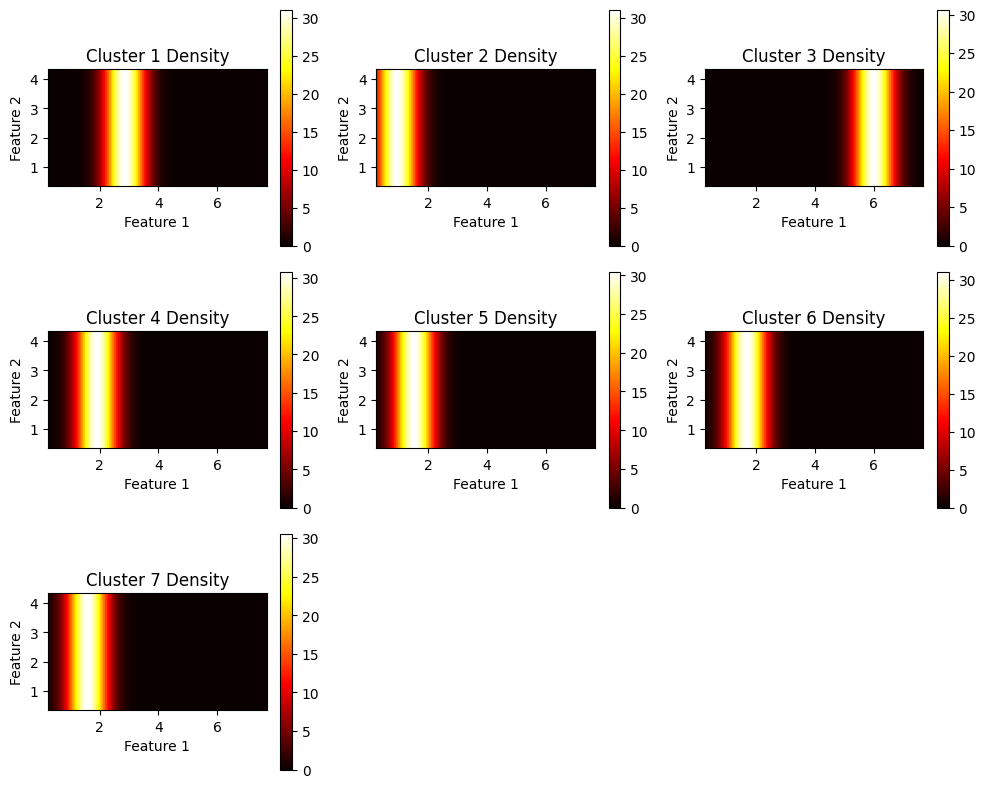

In [ ]:
# Generated by Chat GPT ---> not able to plot by myself

# Calculate cluster centers
cluster_centers = []
for cluster_label in range(7):
    cluster_points = X_test[kmeans_labels == cluster_label]
    cluster_center = cluster_points.mean(axis=0)
    cluster_centers.append(cluster_center)

# Define the grid for density estimation
x = np.linspace(X_test.iloc[:, 0].min(), X_test.iloc[:, 0].max(), 100)
y = np.linspace(X_test.iloc[:, 1].min(), X_test.iloc[:, 1].max(), 100)
X, Y = np.meshgrid(x, y)

# Compute density for each cluster
densities = []
for cluster_center in cluster_centers:
    kernel_bandwidth = 0.5  # adjust this bandwidth if needed
    kernel = np.exp(-0.5 * ((X - cluster_center[0]) ** 2 + (Y - cluster_center[1]) ** 2) / kernel_bandwidth ** 2)
    density = np.sum(kernel, axis=0)
    densities.append(density)

# Plot heatmap for each cluster
plt.figure(figsize=(10, 8))
for i, density in enumerate(densities):
    plt.subplot(3, 3, i+1)
    plt.imshow(np.expand_dims(density, axis=0), cmap='hot', origin='lower', extent=[x.min(), x.max(), y.min(), y.max()])
    plt.title(f'Cluster {i+1} Density')
    plt.colorbar()
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')

plt.tight_layout()
plt.show()

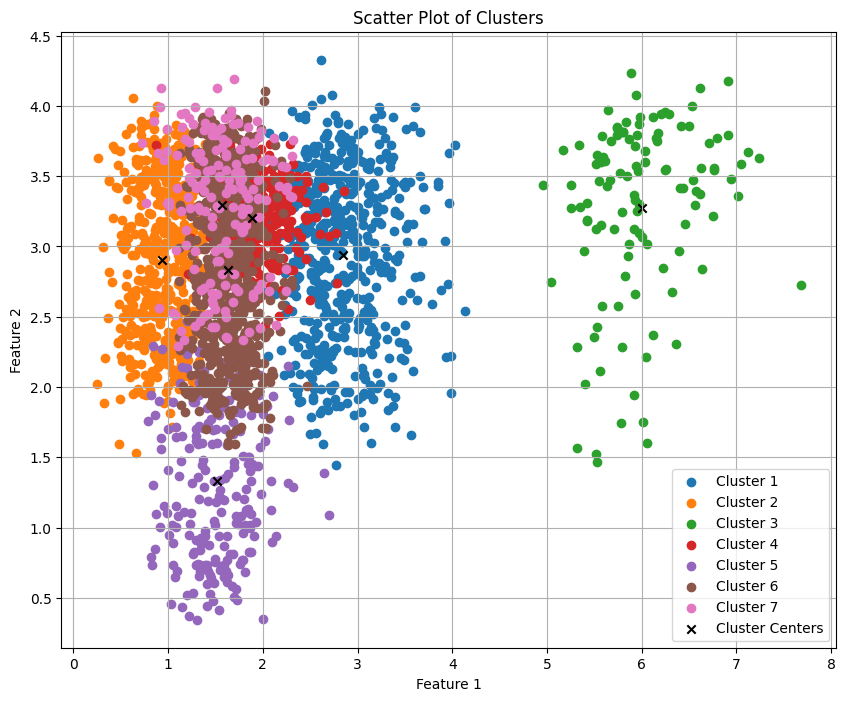

In [ ]:
plt.figure(figsize=(10, 8))
for cluster_label in range(7):
    cluster_points = X_test[kmeans_labels == cluster_label]
    plt.scatter(cluster_points.iloc[:, 0], cluster_points.iloc[:, 1], label=f'Cluster {cluster_label+1}')

# Plot cluster centers
cluster_centers = np.array(cluster_centers)
plt.scatter(cluster_centers[:, 0], cluster_centers[:, 1], marker='x', color='black', label='Cluster Centers')

plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title('Scatter Plot of Clusters')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
#generating dendogram is cost heavy

# Z = linkage(X_train, method='ward')

# # Plot the dendrogram
# plt.figure(figsize=(2, 1))
# dendrogram(Z)
# plt.title('Hierarchical Clustering Dendrogram')
# plt.xlabel('Sample Index')
# plt.ylabel('Distance')
# plt.show()


<------------------- Most interperation using sklearn done ----------------->

In [ ]:
# dump code

# def preprocessing(data):
#   #dropping null values
#   data = data.dropna()

#   # encoding labels to numeric
#   encoder = LabelEncoder()
#   data['Class'] = encoder.fit_transform(data['Class'])

#   # scaling the data
#   scaler = RobustScaler()
#   features = data.columns.drop(['Class' , 'Solidity' , 'ShapeFactor2' , 'ShapeFactor4' , 'ShapeFactor3'])
#   data[features] = scaler.fit_transform(data[features])
#   for col in data:
#       if data[col].min() < 0: # to make data +ve
#           data[col] += abs(data[col].min())

#   #remove outliers
#   orf = ['ShapeFactor2','MajorAxisLength', 'Eccentricity','Solidity'] # outliers_removal_features , i plotted scatter to see weather outliers are present or not
#   z_scores = (data[orf] - data[orf].mean()) / data[orf].std()
#   limiter = 5
#   data = data[(z_scores.abs() < limiter).all(axis=1)]

#   # reducing dimentions by combining features
#   features = ['AspectRation', 'Eccentricity', 'Area', 'Perimeter', 'MajorAxisLength', 'EquivDiameter', 'ConvexArea', 'Compactness', 'ShapeFactor3']
#   names = ['AR/ECC', 'AR/PE/MA/ED/CA', 'CO/SF3']
#   combined_features_df = pd.DataFrame()
#   for name, feature_group in zip(names, [features[:2], features[2:7], features[7:]]):
#       combined_feature = data[feature_group].mean(axis=1)
#       combined_features_df[name] = combined_feature
#   data = pd.concat([data , pd.DataFrame(combined_features_df)] , axis = 1 )
#   data.drop(['AspectRation', 'Eccentricity', 'Area', 'Perimeter', 'MajorAxisLength', 'EquivDiameter', 'ConvexArea', 'Compactness', 'ShapeFactor3'] , axis=1,inplace=True)
#   col = data.pop('Class') #to shift Y(class) to right
#   data['Class'] = col

#   return data
